<a href="https://colab.research.google.com/github/dajley/Analyzing-Outliers-Research-Project/blob/main/IQR_Method_on_Main_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [14]:
#Handling Outliers with IQR Method
#Replacing Outliers with Median
#Building ML Models on Dataset
#Code and Research by Dajanique Leysath

#**Install Libraries**

In [15]:
#For data manipulation and analysis
import pandas as pd

#For scientific computing
import numpy as np

#For interactive plots
#Pyplot function makes changes to figures
import matplotlib.pyplot as plt

#Creates attractive and statistical graphics
import seaborn as sns

In [16]:
#Used to split data into training and testing
from sklearn.model_selection import train_test_split

In [17]:
#For Polynomial Regression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

In [18]:
#Makes a pipeline
from sklearn.pipeline import make_pipeline

In [19]:
#For Random Forest Regression
from sklearn.ensemble import RandomForestRegressor

In [20]:
#For Support Vector Regression
from sklearn.svm import SVR

In [21]:
#For Linear Regression
from sklearn.linear_model import LinearRegression

In [22]:
#For Metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error

In [23]:
#Install YData Profiling
#!pip install ydata-profiling

In [24]:
#For Profiling Report
#Import ProfileReport() class from ydata_profiling library
from ydata_profiling import ProfileReport

#**Dataset**

In [25]:
#Save CSV in dataframe
df_main = pd.read_csv('/content/drive/MyDrive/Datasets/main_with_outliers.csv')

#Lists first 10 rows
df_main.head(10)

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
0,104.9,60.9285,37.1985,49.0635,50.2490,50.8615,7.8580,23.1800,489.1580,0.1835,5.6170,1.3810,34.8855,46.0855
1,59.7,53.1395,31.8545,42.4970,47.2270,46.5050,9.8660,28.0395,447.4045,0.1910,5.8490,2.2715,30.7485,37.6335
2,43.0,60.1670,33.7200,46.9435,52.5145,51.8025,7.5750,23.9520,442.3180,0.2075,6.3380,2.1860,28.4045,44.6370
3,76.8,58.6490,32.1940,45.4220,52.1705,48.8195,8.3395,25.6365,488.8215,0.2055,6.2715,0.7400,30.5045,42.3990
4,94.9,57.2660,34.1885,45.7275,49.0000,47.4995,7.5190,23.1775,396.1995,0.1680,5.1335,2.2735,32.6630,42.4450
5,86.0,58.3285,35.0765,46.7025,48.8065,45.4195,9.1940,24.7650,456.0825,0.1945,5.9380,2.1310,33.8710,42.9830
6,41.0,60.0035,36.3370,48.1705,50.7070,49.0790,9.2575,26.7905,437.1370,0.1910,5.8270,2.0640,34.6745,45.1155
7,56.3,58.9080,36.4330,47.6710,50.7105,50.0910,0.9666,25.4040,457.8330,0.1955,5.9710,2.4680,35.6340,44.8530
8,27.5,65.3490,38.5995,51.9745,53.4775,50.5825,9.3970,24.6430,469.0270,0.2260,6.9170,2.9450,37.0325,49.8755
9,66.7,603.0650,37.1160,48.7115,49.7380,47.5380,10.4655,27.0440,418.6625,0.2105,6.4035,0.2695,33.2895,45.4505


In [26]:
df_main.describe()

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
count,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000
mean,94.711538,67.560204,40.619966,54.220327,56.318528,53.298813,11.378281,28.812858,511.041068,0.223275,6.958245,2.177937,39.246424,50.490129
std,35.748752,71.160593,39.867773,56.735327,61.450905,58.333088,12.847519,31.674484,528.266306,0.213927,7.536020,2.803870,41.124466,56.417984
min,25.400000,5.195350,3.533450,4.537250,4.606650,4.265500,0.833950,2.452050,41.333400,0.014300,0.428450,0.079500,3.309200,4.198500
25%,66.300000,56.516500,33.652500,45.032250,46.244000,43.169750,8.975375,23.551125,427.624500,0.180500,5.515250,0.962500,32.197750,40.595000
50%,92.450000,59.756000,35.994500,47.660000,49.103000,46.533500,9.897500,25.138500,446.817000,0.202500,6.168250,1.635250,34.638000,44.264250
75%,120.625000,61.787000,38.082750,49.759500,51.857375,49.478750,10.670000,26.611125,475.534000,0.218875,6.689000,2.548000,36.446000,46.641875
max,198.000000,623.305000,351.240000,498.645000,528.510000,522.030000,132.530000,289.540000,4754.230000,2.220000,73.175000,30.010000,370.060000,507.080000


#**Exploratory Data Analysis (EDA)**

##**Profile Report**

Pandas Profiling give a full report on the stats and visuals of the dataset

In [27]:
#Pass the dataframe to ProfileReport() class
profile = ProfileReport(df_main, title="Pandas Profiling Report", explorative=True)

In [28]:
#Display report
profile.to_notebook_iframe() #could also just use: profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 14/14 [00:00<00:00, 42.52it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
#Saves the report to an HTML file
profile.to_file("df_main_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#**Data Pre-Processing**

##**Detecting Outliers**

###**Boxplot Visual**

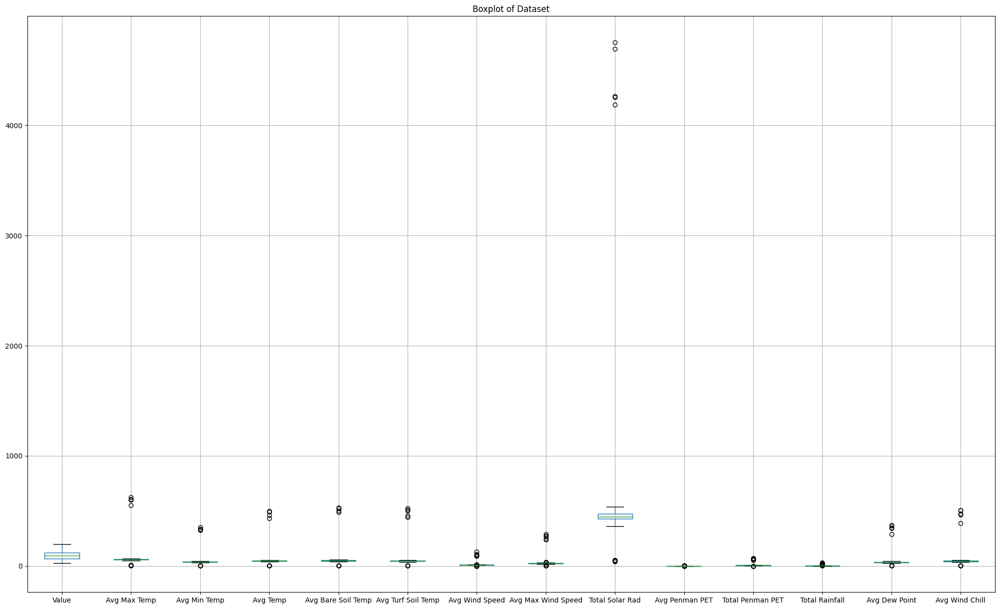

In [30]:
#Shows a boxplot of dataset to detect outliers visually
df_main.boxplot(figsize=(25,15))
plt.title('Boxplot of Dataset')
plt.show()

###**IQR Method**

**Interquartile Range (IQR)** method identifies outliers by measuring the spread between the first quartile (Q1) and third quartile (Q3). Any data point below Q1 - 1.5 * IQR or above Q3 + 1.5 * IQR is considered an outlier.

This is the most commonly used and most trusted approach used in the research field.

In [31]:
#Creates a new dataframe to manipulate data for IQR Method
#Also used for comparison
df_iqr = df_main.copy()

In [32]:
#Uses IQR method to detect outliers

#Excludes 'Value' (the target)
features = df_iqr.drop(columns=['Value'], errors='ignore').select_dtypes(include='number').columns

for col in features:
    Q1 = df_main[col].quantile(0.25)
    Q3 = df_main[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    lower_outliers = df_main[col] < lower_bound
    upper_outliers = df_main[col] > upper_bound
    outliers = lower_outliers | upper_outliers
    num_outliers = outliers.sum()

    # Median value for replacement
    median = df_main[col].median()

    print(f"\n=== {col} ===")
    print(f"IQR: {IQR:.3f}")
    print(f"Lower Bound: {lower_bound:.3f}")
    print(f"Upper Bound: {upper_bound:.3f}")
    print(f"Number of lower outliers: {lower_outliers.sum()}")
    print(f"Number of upper outliers: {upper_outliers.sum()}")
    print(f"Total Outliers: {num_outliers}")

    # Show a few original outlier values
    if num_outliers > 0:
        print("\nOriginal Outlier Values:")
        print(df_main.loc[outliers, col])

    # Replace outliers with median
    df_iqr.loc[outliers, col] = median

    # Show change comparison
    if num_outliers > 0:
        print("\nAfter Replacing Outliers:")
        print(df_iqr.loc[outliers, col])

# df_iqr now contains the cleaned dataset



=== Avg Max Temp ===
IQR: 5.270
Lower Bound: 48.611
Upper Bound: 69.693
Number of lower outliers: 5
Number of upper outliers: 5
Total Outliers: 10

Original Outlier Values:
9      603.06500
33       6.15900
73       6.05050
143    603.65000
155      5.19535
196      5.65800
212    551.45000
227    623.30500
267    599.80500
283      6.20395
Name: Avg Max Temp, dtype: float64

After Replacing Outliers:
9      59.756
33     59.756
73     59.756
143    59.756
155    59.756
196    59.756
212    59.756
227    59.756
267    59.756
283    59.756
Name: Avg Max Temp, dtype: float64

=== Avg Min Temp ===
IQR: 4.430
Lower Bound: 27.007
Upper Bound: 44.728
Number of lower outliers: 5
Number of upper outliers: 5
Total Outliers: 10

Original Outlier Values:
27       3.63370
70       3.94505
87     351.24000
101    325.81000
106    335.79500
109      3.94165
130      3.77755
132      3.53345
135    334.97500
257    334.55500
Name: Avg Min Temp, dtype: float64

After Replacing Outliers:
27     35.994

#**Save as CSV File**

In [33]:
df_iqr.to_csv('/content/drive/MyDrive/Datasets/iqr_dataset.csv', index=False)

#**Comparing Original and New Dataset**

##**EDA**

In [34]:
#Shows general info
df_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286 entries, 0 to 285
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Value               286 non-null    float64
 1   Avg Max Temp        286 non-null    float64
 2   Avg Min Temp        286 non-null    float64
 3   Avg Temp            286 non-null    float64
 4   Avg Bare Soil Temp  286 non-null    float64
 5   Avg Turf Soil Temp  286 non-null    float64
 6   Avg Wind Speed      286 non-null    float64
 7   Avg Max Wind Speed  286 non-null    float64
 8   Total Solar Rad     286 non-null    float64
 9   Avg Penman PET      286 non-null    float64
 10  Total Penman PET    286 non-null    float64
 11  Total Rainfall      286 non-null    float64
 12  Avg Dew Point       286 non-null    float64
 13  Avg Wind Chill      286 non-null    float64
dtypes: float64(14)
memory usage: 31.4 KB


In [35]:
df_iqr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286 entries, 0 to 285
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Value               286 non-null    float64
 1   Avg Max Temp        286 non-null    float64
 2   Avg Min Temp        286 non-null    float64
 3   Avg Temp            286 non-null    float64
 4   Avg Bare Soil Temp  286 non-null    float64
 5   Avg Turf Soil Temp  286 non-null    float64
 6   Avg Wind Speed      286 non-null    float64
 7   Avg Max Wind Speed  286 non-null    float64
 8   Total Solar Rad     286 non-null    float64
 9   Avg Penman PET      286 non-null    float64
 10  Total Penman PET    286 non-null    float64
 11  Total Rainfall      286 non-null    float64
 12  Avg Dew Point       286 non-null    float64
 13  Avg Wind Chill      286 non-null    float64
dtypes: float64(14)
memory usage: 31.4 KB


In [36]:
#Shows the shape
df_main.shape

(286, 14)

In [37]:
df_iqr.shape

(286, 14)

In [38]:
#Checks for null values
df_main.isnull().sum()

,0
Value,0
Avg Max Temp,0
Avg Min Temp,0
Avg Temp,0
Avg Bare Soil Temp,0
Avg Turf Soil Temp,0
Avg Wind Speed,0
Avg Max Wind Speed,0
Total Solar Rad,0
Avg Penman PET,0


In [39]:
df_iqr.isnull().sum()

,0
Value,0
Avg Max Temp,0
Avg Min Temp,0
Avg Temp,0
Avg Bare Soil Temp,0
Avg Turf Soil Temp,0
Avg Wind Speed,0
Avg Max Wind Speed,0
Total Solar Rad,0
Avg Penman PET,0


In [40]:
#Checks for unique values
df_main.nunique()

,0
Value,250
Avg Max Temp,205
Avg Min Temp,203
Avg Temp,203
Avg Bare Soil Temp,202
Avg Turf Soil Temp,205
Avg Wind Speed,198
Avg Max Wind Speed,198
Total Solar Rad,206
Avg Penman PET,142


In [41]:
df_iqr.nunique()

,0
Value,250
Avg Max Temp,195
Avg Min Temp,193
Avg Temp,194
Avg Bare Soil Temp,193
Avg Turf Soil Temp,196
Avg Wind Speed,184
Avg Max Wind Speed,185
Total Solar Rad,196
Avg Penman PET,132


##**Identifying Data Distribution**

**Descriptive Statistics**: Mean, Median, Standard Deviation, Skewness, and Kurtosis

The **mean** and **median** can help identify the central tendency of the data.

The **standard deviation** indicates how data points are disperced around the central value.

In [42]:
#Shows basic descriptive statistics
df_main.describe()

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
count,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000
mean,94.711538,67.560204,40.619966,54.220327,56.318528,53.298813,11.378281,28.812858,511.041068,0.223275,6.958245,2.177937,39.246424,50.490129
std,35.748752,71.160593,39.867773,56.735327,61.450905,58.333088,12.847519,31.674484,528.266306,0.213927,7.536020,2.803870,41.124466,56.417984
min,25.400000,5.195350,3.533450,4.537250,4.606650,4.265500,0.833950,2.452050,41.333400,0.014300,0.428450,0.079500,3.309200,4.198500
25%,66.300000,56.516500,33.652500,45.032250,46.244000,43.169750,8.975375,23.551125,427.624500,0.180500,5.515250,0.962500,32.197750,40.595000
50%,92.450000,59.756000,35.994500,47.660000,49.103000,46.533500,9.897500,25.138500,446.817000,0.202500,6.168250,1.635250,34.638000,44.264250
75%,120.625000,61.787000,38.082750,49.759500,51.857375,49.478750,10.670000,26.611125,475.534000,0.218875,6.689000,2.548000,36.446000,46.641875
max,198.000000,623.305000,351.240000,498.645000,528.510000,522.030000,132.530000,289.540000,4754.230000,2.220000,73.175000,30.010000,370.060000,507.080000


In [43]:
df_iqr.describe()

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
count,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000,286.000000
mean,94.711538,59.123205,35.930241,47.490731,48.974659,46.351455,9.785341,24.963935,448.372661,0.199056,6.074610,1.794798,34.394890,43.785026
std,35.748752,3.727126,2.736217,3.002636,3.390117,4.000777,1.104590,2.096957,31.664499,0.026242,0.804902,0.985791,3.049329,3.860013
min,25.400000,49.942500,29.261500,40.661500,39.873500,36.401000,7.519000,19.002000,362.750000,0.138500,4.244000,0.079500,26.804500,34.539500
25%,66.300000,56.710500,33.726375,45.205000,46.503375,43.481000,9.050500,23.882125,428.604500,0.182500,5.576500,0.962500,32.772000,40.790000
50%,92.450000,59.756000,35.994500,47.660000,49.103000,46.533500,9.897500,25.138500,446.817000,0.202500,6.168250,1.630125,34.638000,44.264250
75%,120.625000,61.673000,37.774500,49.716000,51.534125,49.329000,10.470500,26.259625,470.152000,0.217500,6.647500,2.436875,36.244625,46.364250
max,198.000000,67.994000,42.368500,54.553000,55.995000,55.556000,12.977500,31.141500,536.538000,0.248500,7.669000,4.855000,42.040500,52.869500


count = amount of rows

mean = average

std = standard deviation

min = minimum value

25% = lower quartile

50% = median

75% = upper quartile

max = maximum value

In [44]:
#Shows mean
df_main.mean()

,0
Value,94.711538
Avg Max Temp,67.560204
Avg Min Temp,40.619966
Avg Temp,54.220327
Avg Bare Soil Temp,56.318528
Avg Turf Soil Temp,53.298813
Avg Wind Speed,11.378281
Avg Max Wind Speed,28.812858
Total Solar Rad,511.041068
Avg Penman PET,0.223275


In [45]:
df_iqr.mean()

,0
Value,94.711538
Avg Max Temp,59.123205
Avg Min Temp,35.930241
Avg Temp,47.490731
Avg Bare Soil Temp,48.974659
Avg Turf Soil Temp,46.351455
Avg Wind Speed,9.785341
Avg Max Wind Speed,24.963935
Total Solar Rad,448.372661
Avg Penman PET,0.199056


In [46]:
#Shows median
df_main.median()

,0
Value,92.45000
Avg Max Temp,59.75600
Avg Min Temp,35.99450
Avg Temp,47.66000
Avg Bare Soil Temp,49.10300
Avg Turf Soil Temp,46.53350
Avg Wind Speed,9.89750
Avg Max Wind Speed,25.13850
Total Solar Rad,446.81700
Avg Penman PET,0.20250


In [47]:
df_iqr.median()

,0
Value,92.450000
Avg Max Temp,59.756000
Avg Min Temp,35.994500
Avg Temp,47.660000
Avg Bare Soil Temp,49.103000
Avg Turf Soil Temp,46.533500
Avg Wind Speed,9.897500
Avg Max Wind Speed,25.138500
Total Solar Rad,446.817000
Avg Penman PET,0.202500


In [48]:
#Shows standard deviation
df_main.std()

,0
Value,35.748752
Avg Max Temp,71.160593
Avg Min Temp,39.867773
Avg Temp,56.735327
Avg Bare Soil Temp,61.450905
Avg Turf Soil Temp,58.333088
Avg Wind Speed,12.847519
Avg Max Wind Speed,31.674484
Total Solar Rad,528.266306
Avg Penman PET,0.213927


In [49]:
df_iqr.std()

,0
Value,35.748752
Avg Max Temp,3.727126
Avg Min Temp,2.736217
Avg Temp,3.002636
Avg Bare Soil Temp,3.390117
Avg Turf Soil Temp,4.000777
Avg Wind Speed,1.104590
Avg Max Wind Speed,2.096957
Total Solar Rad,31.664499
Avg Penman PET,0.026242


The **Skewness** measures the asymmetry of the data distribution.

The **Kurtosis** measures the peaakedness or flatness of the distribution.

If Skewness = 0, then **normal distribution**.

mean = median = mode

If Skewness > 0, then **negatively skewed** (or left skewed).

mean < median < mode

If Skewness < 0, then **positively skewed** (or right skewed).

mean > median > mode

In [50]:
#Calculates skew
df_main.skew()

,0
Value,0.318464
Avg Max Temp,7.275026
Avg Min Temp,7.219764
Avg Temp,7.290634
Avg Bare Soil Temp,7.273179
Avg Turf Soil Temp,7.298337
Avg Wind Speed,7.483772
Avg Max Wind Speed,7.299441
Total Solar Rad,7.282814
Avg Penman PET,7.505830


In [51]:
df_iqr.skew()

,0
Value,0.318464
Avg Max Temp,-0.262215
Avg Min Temp,0.086829
Avg Temp,0.052075
Avg Bare Soil Temp,-0.149441
Avg Turf Soil Temp,-0.129888
Avg Wind Speed,0.089846
Avg Max Wind Speed,-0.264243
Total Solar Rad,0.040680
Avg Penman PET,-0.357834


Kurtosis uses Fisher's definition & Excess Kurtosis uses Pearson's definition.

If Kurtosis = 3 or Excess Kurtosis = 0, then **mesokurtic**. (perfectly normal distribution)

If Kurtosis > 3 or Excess Kurtosis > 0, then **leptokurtic**. (sharp peak, heavy tails)

If Kurtosis < 3 or Excess Kurtosis < 0, then **playkurtic**. (flat peak, light tails)

In [52]:
#Calculates kurtosis
df_main.kurtosis()

,0
Value,-0.309842
Avg Max Temp,52.219673
Avg Min Temp,51.574280
Avg Temp,52.542291
Avg Bare Soil Temp,52.103534
Avg Turf Soil Temp,52.788890
Avg Wind Speed,57.193733
Avg Max Wind Speed,52.890620
Total Solar Rad,52.520906
Avg Penman PET,58.714098


In [53]:
df_iqr.kurtosis()

,0
Value,-0.309842
Avg Max Temp,-0.322533
Avg Min Temp,-0.527846
Avg Temp,-0.623958
Avg Bare Soil Temp,-0.558633
Avg Turf Soil Temp,-0.444738
Avg Wind Speed,0.040291
Avg Max Wind Speed,0.582799
Total Solar Rad,-0.230630
Avg Penman PET,-0.597115


In [54]:
#Shows correlations between features
df_main.corr()

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
Value,1.000000,0.013430,0.007144,-0.083690,-0.007210,-0.078259,-0.026738,0.041294,0.034275,-0.016015,-0.059272,0.028860,-0.064730,0.107953
Avg Max Temp,0.013430,1.000000,-0.017703,-0.009782,-0.006693,-0.009729,-0.011732,-0.014006,0.200057,0.116563,-0.004998,-0.072589,-0.011942,-0.002389
Avg Min Temp,0.007144,-0.017703,1.000000,0.177636,-0.014410,-0.031006,0.000063,-0.010533,-0.019928,-0.016238,-0.014214,-0.041857,-0.017514,-0.011369
Avg Temp,-0.083690,-0.009782,0.177636,1.000000,-0.007755,-0.008383,-0.002428,-0.011692,-0.036261,-0.002251,-0.018741,-0.041071,-0.013149,-0.025752
Avg Bare Soil Temp,-0.007210,-0.006693,-0.014410,-0.007755,1.000000,-0.003139,-0.013874,-0.013942,-0.012063,-0.005123,0.163645,-0.043848,-0.007823,-0.001908
Avg Turf Soil Temp,-0.078259,-0.009729,-0.031006,-0.008383,-0.003139,1.000000,-0.019679,-0.016152,-0.014634,-0.007892,-0.008199,-0.021493,-0.024915,-0.006500
Avg Wind Speed,-0.026738,-0.011732,0.000063,-0.002428,-0.013874,-0.019679,1.000000,0.003329,-0.008866,-0.033181,-0.009694,-0.015215,-0.021477,0.166422
Avg Max Wind Speed,0.041294,-0.014006,-0.010533,-0.011692,-0.013942,-0.016152,0.003329,1.000000,-0.034795,-0.015413,-0.012736,0.033347,-0.030212,-0.033345
Total Solar Rad,0.034275,0.200057,-0.019928,-0.036261,-0.012063,-0.014634,-0.008866,-0.034795,1.000000,0.001058,0.001797,-0.025403,-0.018159,-0.015120
Avg Penman PET,-0.016015,0.116563,-0.016238,-0.002251,-0.005123,-0.007892,-0.033181,-0.015413,0.001058,1.000000,-0.002470,-0.038782,-0.006556,-0.022980


In [55]:
df_iqr.corr()

,Value,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
Value,1.000000,-0.113116,0.016082,-0.055996,-0.230723,-0.329826,0.017670,0.163626,-0.155565,-0.199577,-0.214067,0.170473,0.138536,-0.073006
Avg Max Temp,-0.113116,1.000000,0.712400,0.927277,0.839713,0.656995,-0.119059,-0.215411,0.298763,0.704589,0.729589,-0.113449,0.358802,0.939282
Avg Min Temp,0.016082,0.712400,1.000000,0.882399,0.581208,0.561592,-0.065488,-0.273277,-0.080993,0.232267,0.248104,0.217369,0.756711,0.823222
Avg Temp,-0.055996,0.927277,0.882399,1.000000,0.782904,0.656426,-0.101090,-0.267091,0.152690,0.531169,0.557063,0.028665,0.565364,0.964571
Avg Bare Soil Temp,-0.230723,0.839713,0.581208,0.782904,1.000000,0.763587,-0.178374,-0.143674,0.311815,0.613184,0.631674,-0.096861,0.262856,0.821114
Avg Turf Soil Temp,-0.329826,0.656995,0.561592,0.656426,0.763587,1.000000,-0.206443,-0.204588,0.224019,0.443594,0.453578,-0.049499,0.212921,0.684831
Avg Wind Speed,0.017670,-0.119059,-0.065488,-0.101090,-0.178374,-0.206443,1.000000,0.552029,-0.003435,0.177600,0.153018,0.119057,-0.022505,-0.206567
Avg Max Wind Speed,0.163626,-0.215411,-0.273277,-0.267091,-0.143674,-0.204588,0.552029,1.000000,0.021388,0.142841,0.124044,0.095126,-0.294815,-0.286512
Total Solar Rad,-0.155565,0.298763,-0.080993,0.152690,0.311815,0.224019,-0.003435,0.021388,1.000000,0.578611,0.586989,-0.408693,-0.292627,0.195076
Avg Penman PET,-0.199577,0.704589,0.232267,0.531169,0.613184,0.443594,0.177600,0.142841,0.578611,1.000000,0.935173,-0.282750,-0.227567,0.563095


##**Visualization**

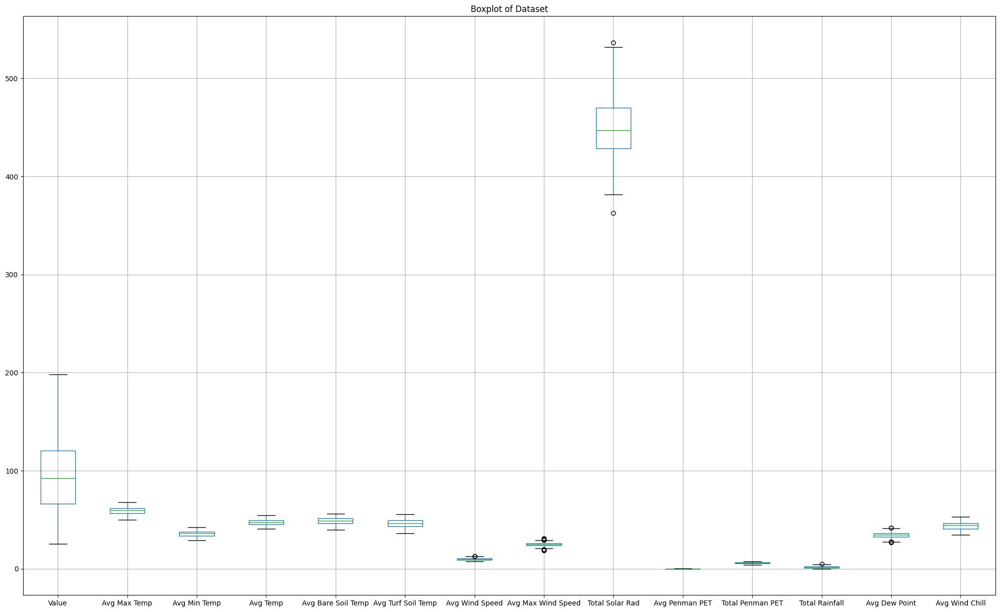

In [56]:
#Shows a boxplot of dataset to detect outliers visually
df_iqr.boxplot(figsize=(25,15))
plt.title('Boxplot of Dataset')
plt.show()

Correlation strengths (direction does not matter):

Strong Correlation: x > 0.5

Moderate Correlation: 0.3 < x < 0.5

Weak Correlation: x < 0.3

Which features are most correlated with crop yield?

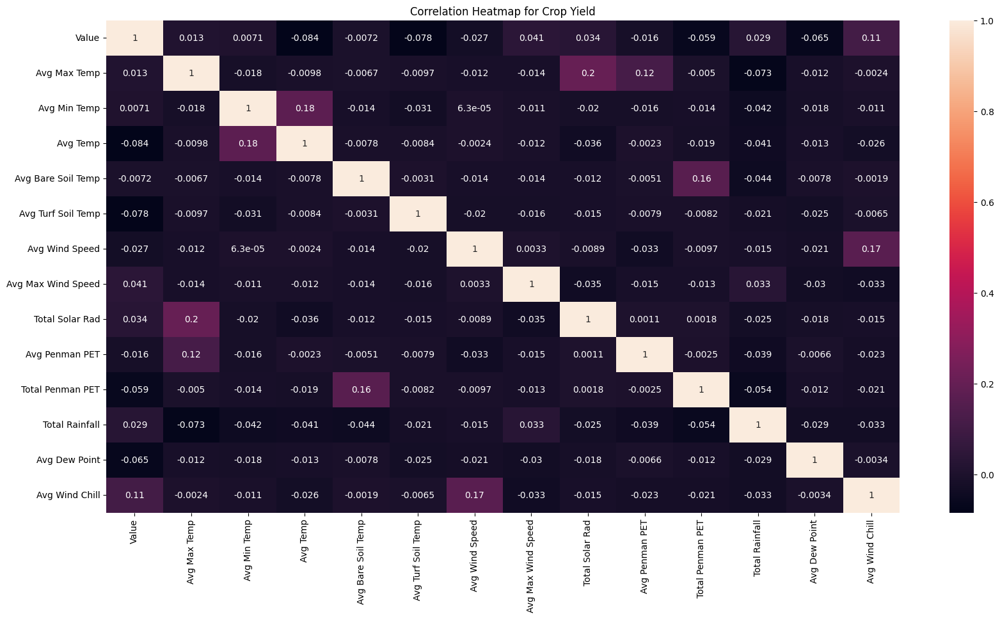

In [98]:
#Shows heatmap of correlation between features
sns.heatmap(df_main.corr(), annot=True)
plt.title("Correlation Heatmap for Crop Yield")
plt.rcParams['figure.figsize'] = [20, 10]
plt.show()

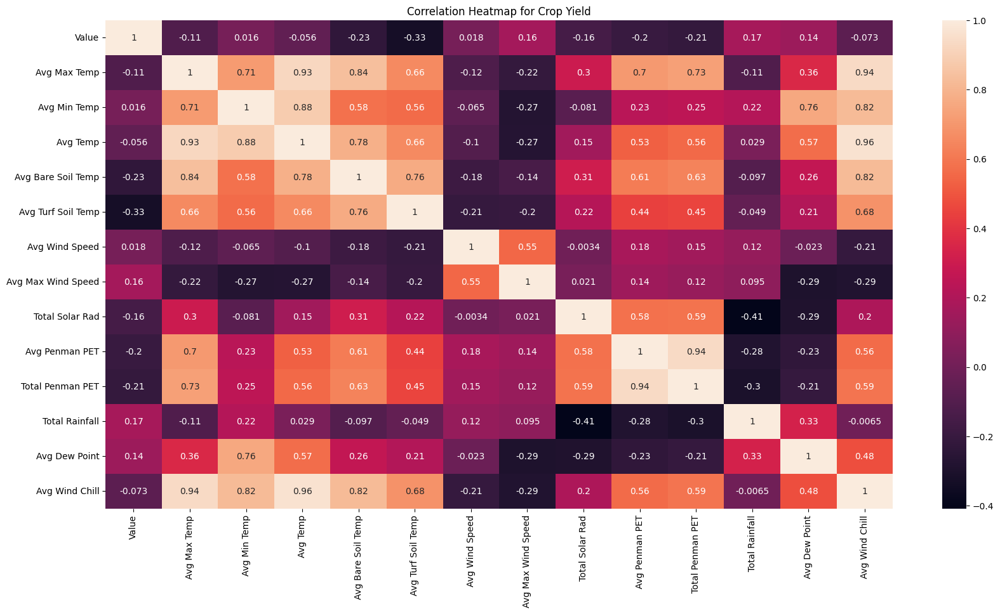

In [58]:
#Shows heatmap of correlation between features
sns.heatmap(df_iqr.corr(), annot=True)
plt.title("Correlation Heatmap for Crop Yield")
plt.rcParams['figure.figsize'] = [20, 10]
plt.show()

<Figure size 1000x1000 with 0 Axes>

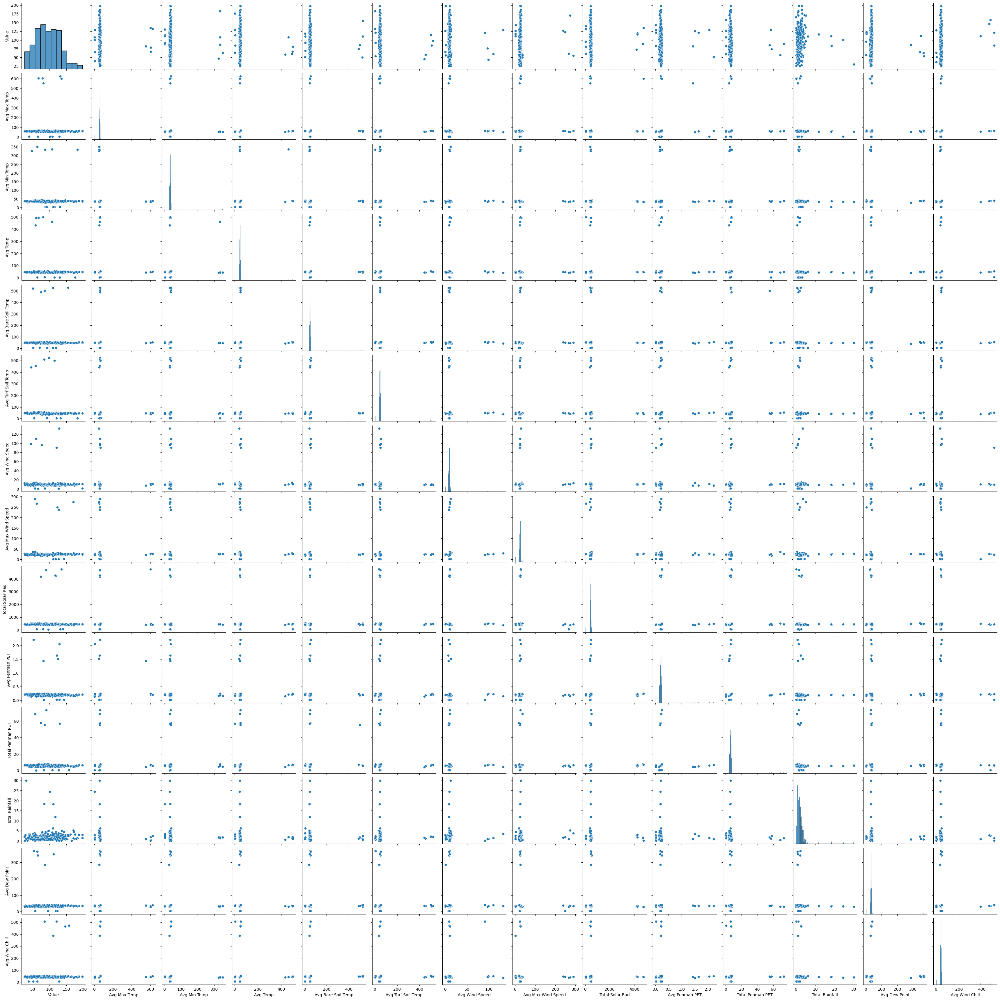

In [59]:
#Shows scatter plot of correlations between features
plt.figure(figsize=(10,10))
sns.pairplot(df_main)
plt.show()

<Figure size 1000x1000 with 0 Axes>

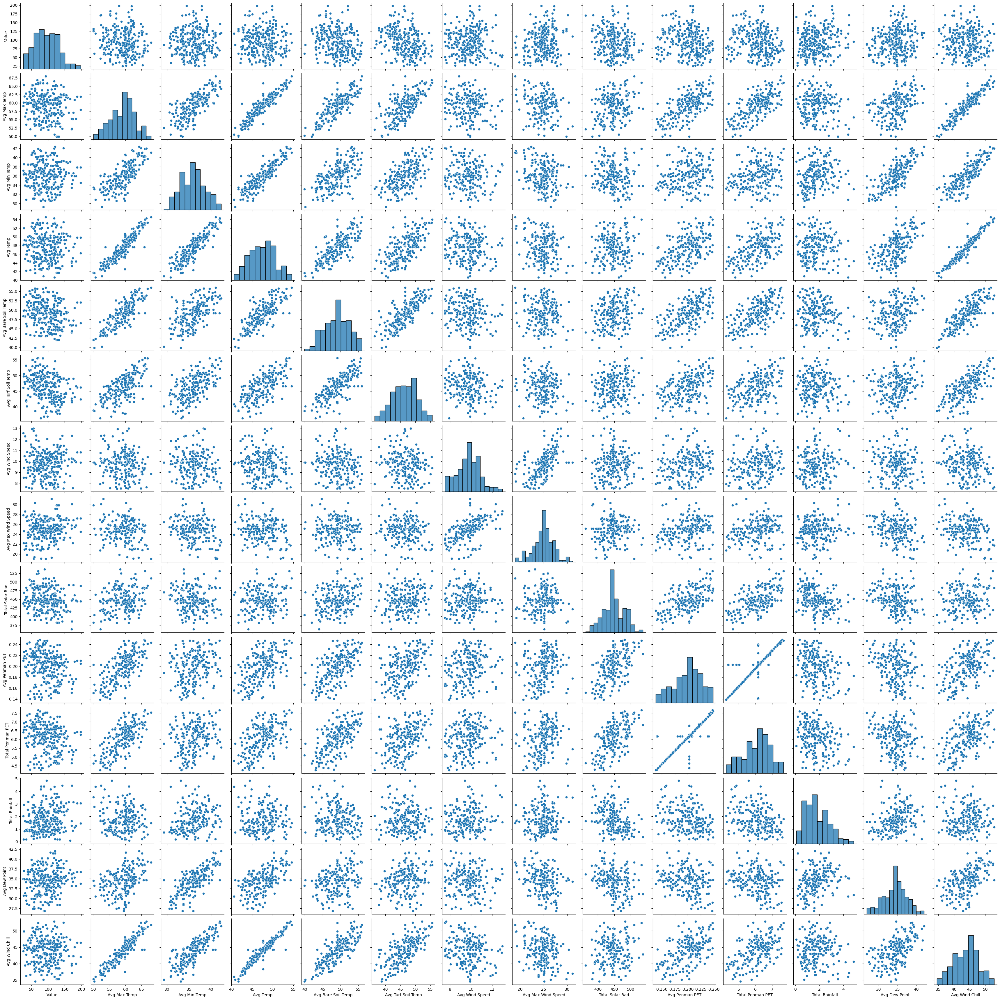

In [60]:
#Shows scatter plot of correlations between features
plt.figure(figsize=(10,10))
sns.pairplot(df_iqr)
plt.show()

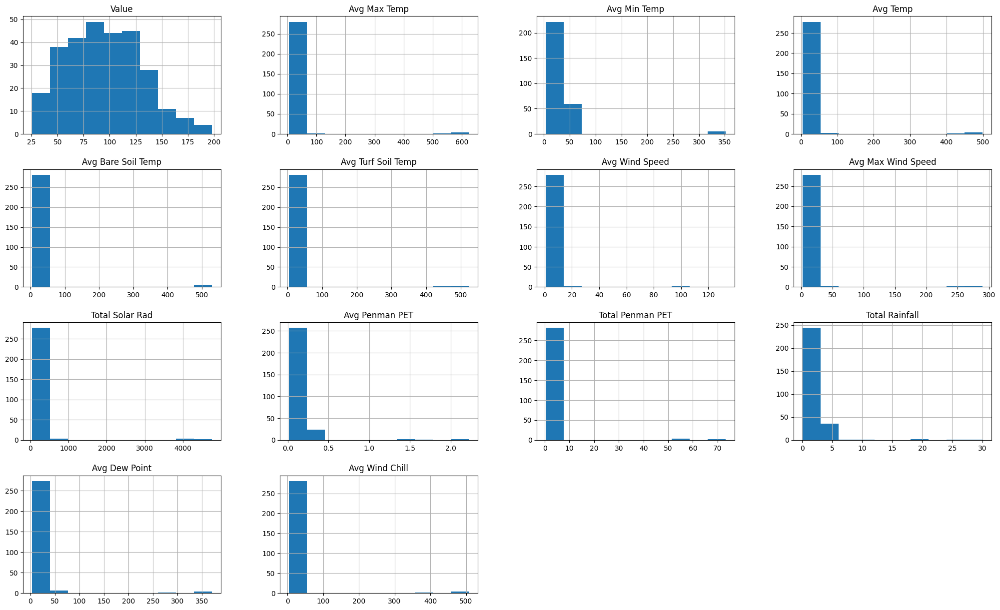

In [61]:
#Shows a histogram for each feature
df_main.hist(figsize=(25,15))
plt.show()

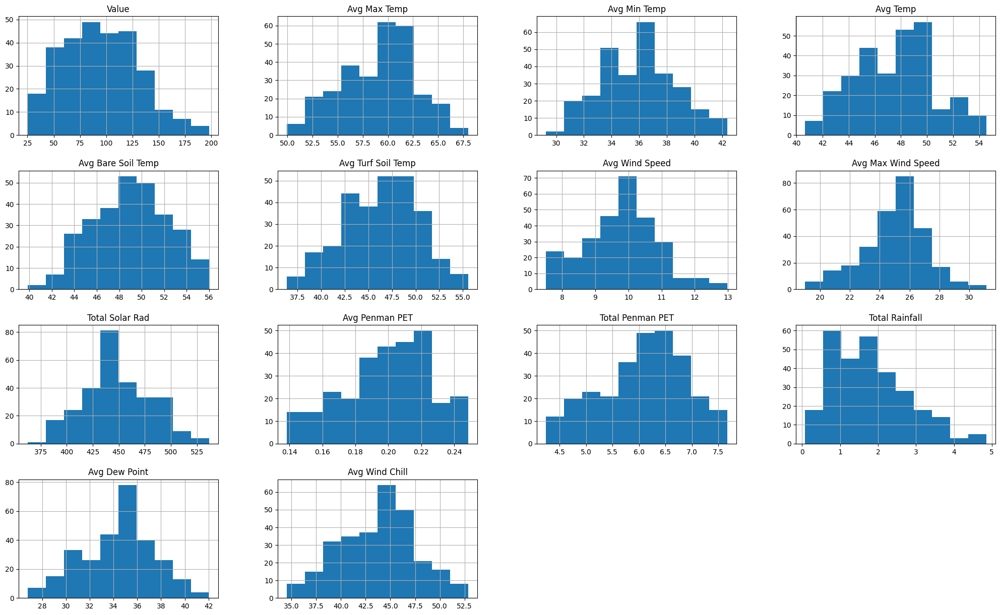

In [62]:
#Shows a histogram for each feature
df_iqr.hist(figsize=(25,15))
plt.show()

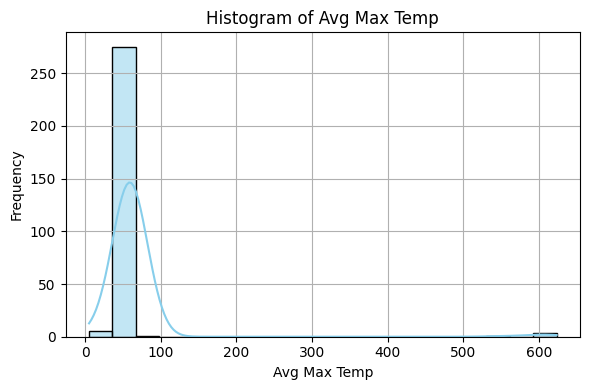

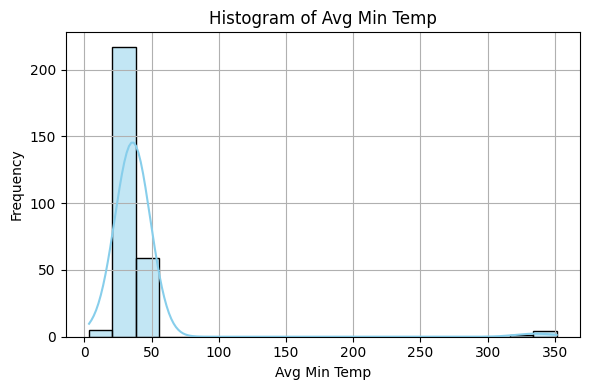

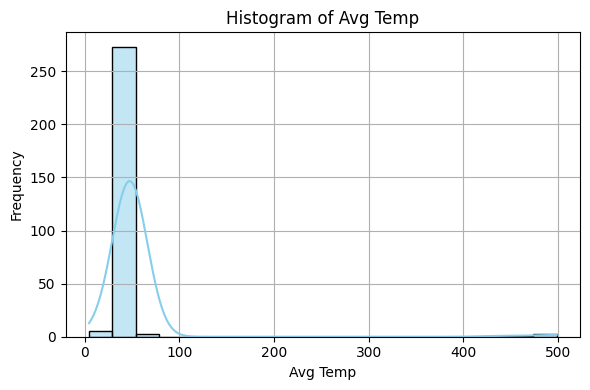

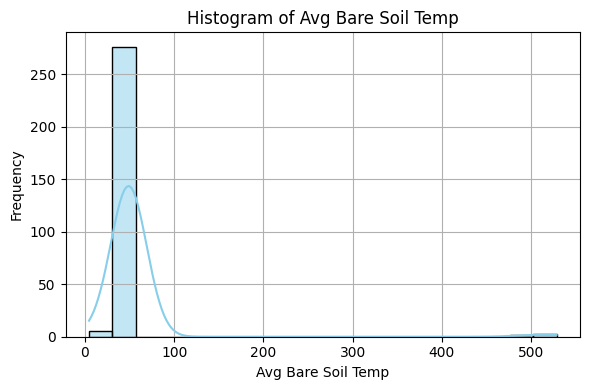

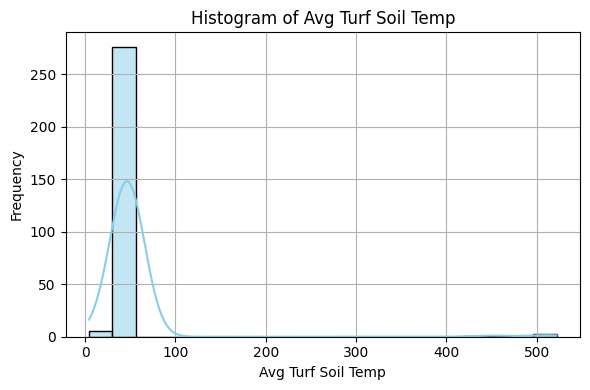

...

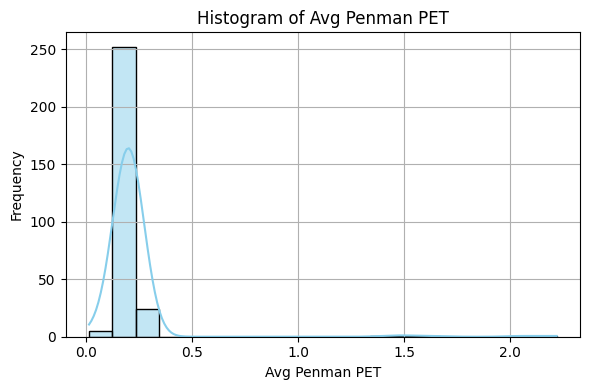

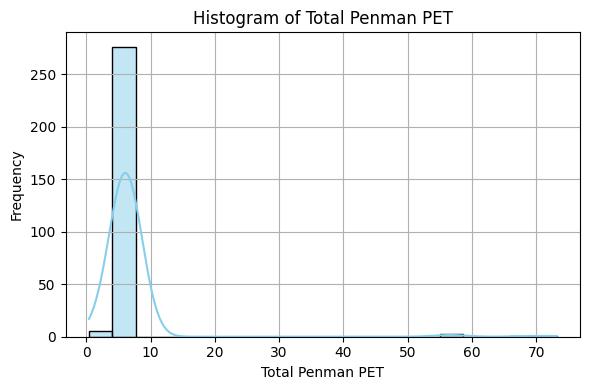

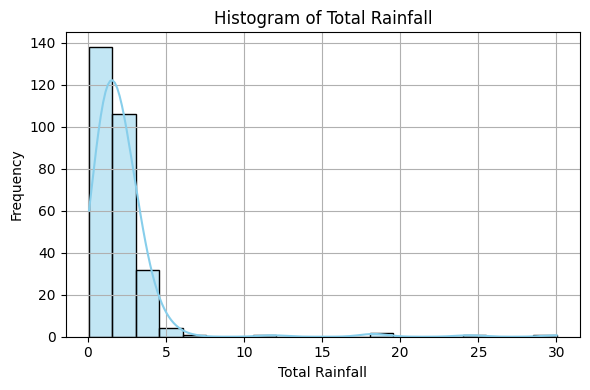

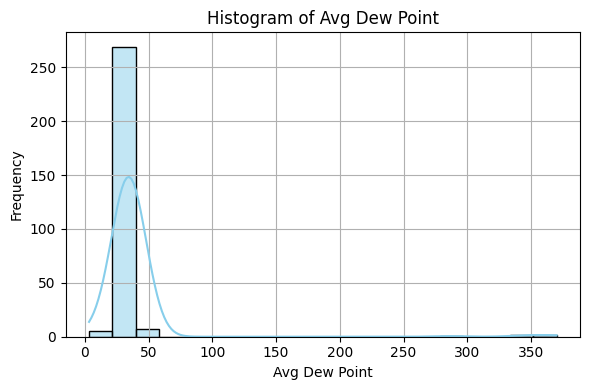

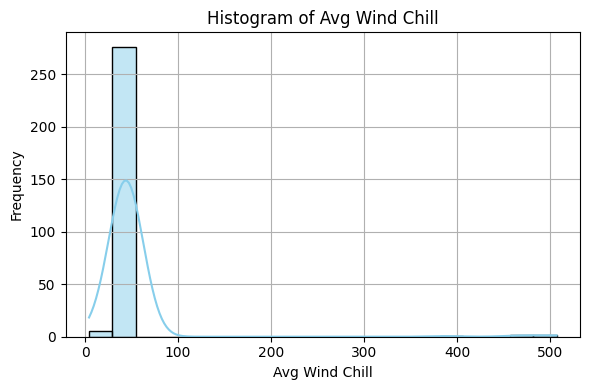

In [63]:
#Shows histogram for each feature compared to the target 'Value'
#Loop is used to go through each feature one by one
features = df_main.columns[1:14]
#features = df_main.columns[df_main.columns != 'Value']  --> excludes target column

for feature in features:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_main[feature], kde=True, bins=20, color='skyblue')
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

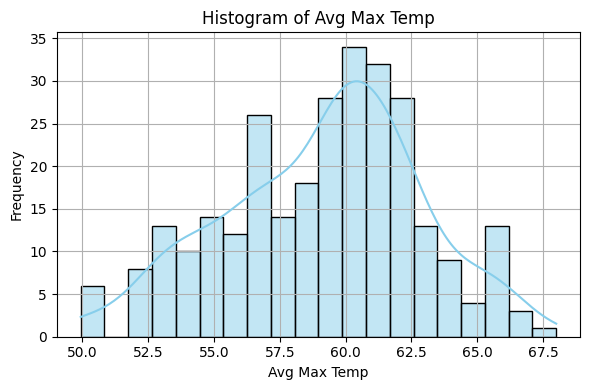

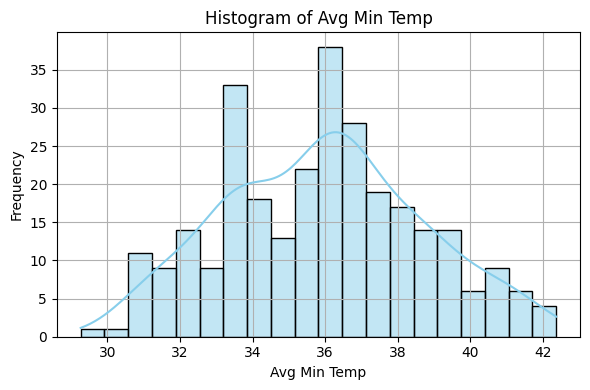

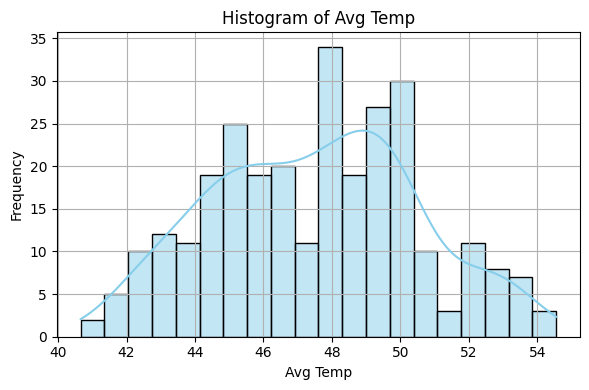

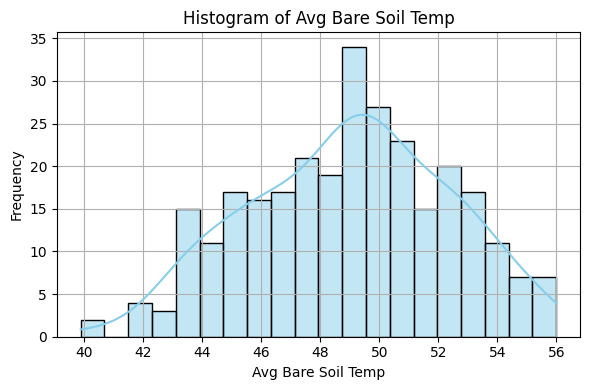

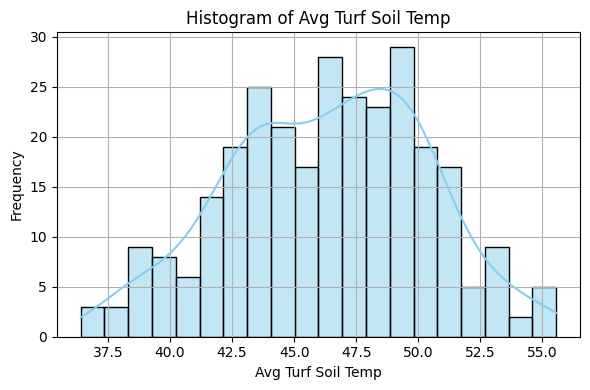

...

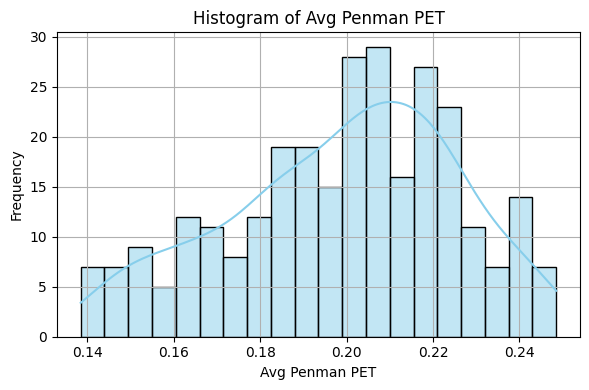

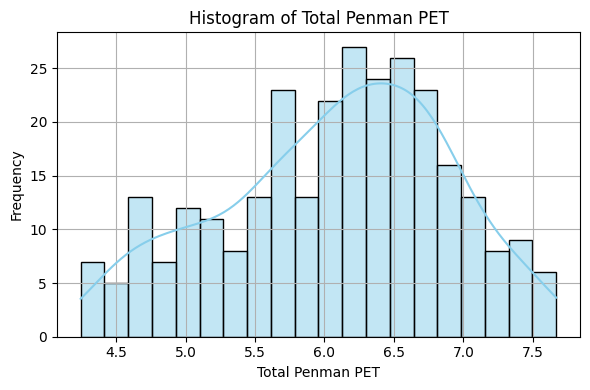

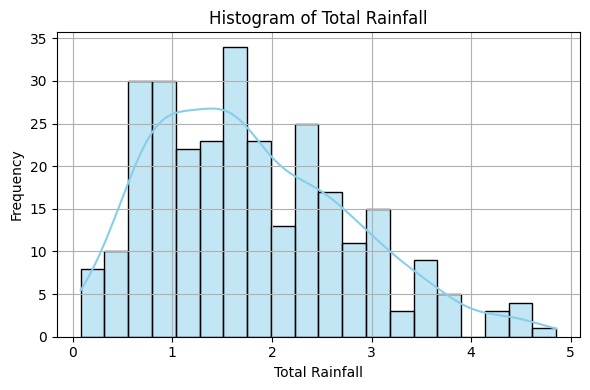

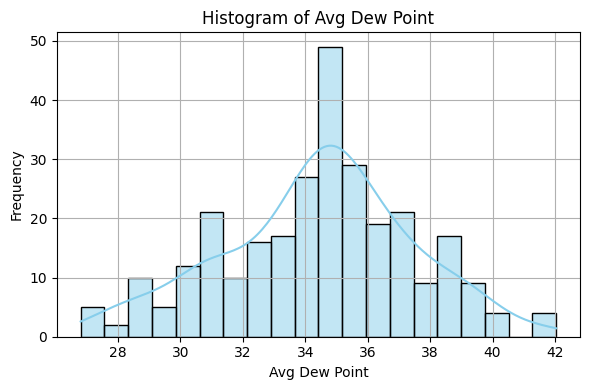

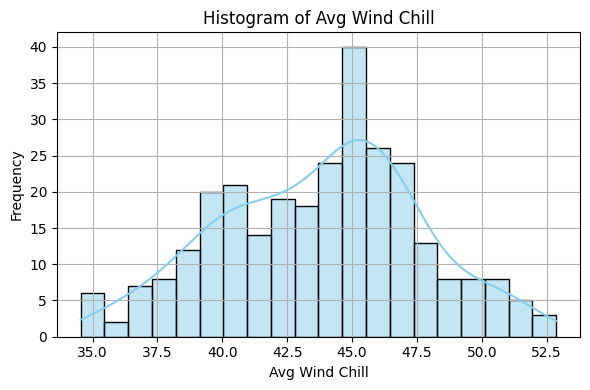

In [64]:
#Shows histogram for each feature compared to the target 'Value'
#Loop is used to go through each feature one by one
features = df_iqr.columns[1:14]
#features = df_main.columns[df_main.columns != 'Value']  --> excludes target column

for feature in features:
    plt.figure(figsize=(6, 4))
    sns.histplot(df_iqr[feature], kde=True, bins=20, color='skyblue')
    plt.title(f'Histogram of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

#**Data Preperation**

**Seperate data into X and Y**

In [65]:
#Define the target "Value" as y
y = df_iqr['Value']
y

,Value
0,104.9
1,59.7
2,43.0
3,76.8
4,94.9
...,...
281,117.1
282,39.7
283,65.1
284,98.6


In [66]:
#Define the features without the target "Value" as x
x = df_iqr.drop('Value', axis=1) #axis = 1 does column, axis = 0 does row
x

,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
0,60.9285,37.1985,49.0635,50.2490,50.8615,7.8580,23.1800,489.1580,0.1835,5.6170,1.3810,34.8855,46.0855
1,53.1395,31.8545,42.4970,47.2270,46.5050,9.8660,28.0395,447.4045,0.1910,5.8490,2.2715,30.7485,37.6335
2,60.1670,33.7200,46.9435,52.5145,51.8025,7.5750,23.9520,442.3180,0.2075,6.3380,2.1860,28.4045,44.6370
3,58.6490,32.1940,45.4220,52.1705,48.8195,8.3395,25.6365,488.8215,0.2055,6.2715,0.7400,30.5045,42.3990
4,57.2660,34.1885,45.7275,49.0000,47.4995,7.5190,23.1775,396.1995,0.1680,5.1335,2.2735,32.6630,42.4450
...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,62.7390,36.9900,49.8645,51.3840,42.9890,10.7280,26.8820,511.3620,0.2350,7.1915,0.9650,36.1970,47.0220
282,60.0255,35.2670,47.6465,48.9125,43.6705,8.9215,23.2990,427.6245,0.1820,5.5765,2.5450,36.7735,44.8625
283,59.7560,35.7990,48.9195,50.1140,47.6505,10.8985,21.7265,448.2195,0.2285,6.9955,0.7300,34.6885,44.7150
284,63.8520,40.2650,52.0590,52.7185,51.1560,10.7980,21.0045,418.0985,0.1990,6.0710,2.3815,40.1690,48.5900


**Split the data into training and testing**

In [67]:
#creates 4 variables
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [68]:
#shows 80% of data
x_train

,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
139,58.1885,34.3745,46.2820,50.2890,49.4465,10.1725,25.5455,482.9155,0.2170,6.6100,1.5275,31.0480,42.5615
25,64.1465,37.4505,50.7985,55.4535,54.3255,9.5945,26.1580,449.9430,0.2345,7.1585,1.9170,34.0605,48.5750
82,56.6120,36.2730,46.4430,46.2225,45.1465,10.6710,25.1600,464.4590,0.1800,5.5415,0.9500,34.6380,41.2925
144,59.0220,39.3410,49.1815,49.0625,49.0225,11.0530,25.8375,442.5125,0.1875,5.7260,3.6680,38.3950,45.3900
66,60.8520,37.4760,49.1640,51.6620,50.8285,10.2400,25.1385,399.7950,0.2070,6.3180,2.5950,34.6720,46.2750
...,...,...,...,...,...,...,...,...,...,...,...,...,...
188,55.1325,35.0595,45.0960,45.9585,44.3845,7.5575,22.2085,450.0720,0.1675,5.1315,0.8770,34.2910,42.2965
71,55.8675,31.6130,43.7405,44.7285,43.9295,10.3550,26.5920,476.5695,0.2145,6.5735,0.7845,28.7730,38.7750
106,58.3820,35.9945,47.6600,46.4845,45.0275,10.3880,25.6520,454.6380,0.2150,6.5705,1.8960,30.2990,42.2180
270,62.5815,37.4175,50.0000,48.9735,41.5925,11.4090,26.9345,439.4525,0.2210,6.7335,2.7450,35.5725,46.4770


In [69]:
#shape of x_train
x_train.shape

(228, 13)

In [70]:
#shows 20% of data
x_test

,Avg Max Temp,Avg Min Temp,Avg Temp,Avg Bare Soil Temp,Avg Turf Soil Temp,Avg Wind Speed,Avg Max Wind Speed,Total Solar Rad,Avg Penman PET,Total Penman PET,Total Rainfall,Avg Dew Point,Avg Wind Chill
9,59.7560,37.1160,48.7115,49.7380,47.5380,10.4655,27.0440,418.6625,0.2105,6.40350,0.26950,33.2895,45.45050
267,59.7560,31.9250,45.9530,49.6965,37.8085,11.2915,27.6480,446.8170,0.2390,7.31150,0.19250,28.3810,41.98500
143,59.7560,36.6020,48.4840,50.4850,50.0335,9.6585,25.2500,460.6345,0.2165,6.62450,1.93000,33.8475,45.05100
212,59.7560,35.6535,45.3995,45.2325,45.3710,7.7665,21.5215,415.6500,0.2025,4.38600,0.87400,37.0760,41.90550
227,59.7560,39.0605,50.6955,52.8510,48.6460,11.0810,27.2805,413.0720,0.1980,6.05100,2.42300,39.5625,48.04650
155,59.7560,33.0505,42.5020,46.7240,44.0985,9.5825,27.0005,445.6035,0.1845,5.66300,1.63525,32.1465,37.54750
283,59.7560,35.7990,48.9195,50.1140,47.6505,10.8985,21.7265,448.2195,0.2285,6.99550,0.73000,34.6885,44.71500
73,59.7560,38.2095,49.3575,49.2780,48.3295,10.7115,27.8585,438.2450,0.2025,6.28200,1.40000,35.9260,45.93100
196,59.7560,38.2415,47.4110,47.0260,44.3895,8.0275,22.4170,392.3105,0.1415,6.16825,2.91500,38.3440,44.33100
33,59.7560,38.4945,50.0425,51.9075,48.7160,9.1675,23.8705,444.9710,0.2025,6.17150,1.54300,37.2150,47.06200


In [71]:
#shape of x_test
x_test.shape

(58, 13)

#**Model Building**

##**Polynomial Regression**

Used to model a non-linear relationship between the dependent variable and independent variables.

**Training the model**

In [72]:
# Use a pipeline to combine polynomial features and linear regression
pr_model = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())

#Train the empty model on following dataset
pr_model.fit(x_train, y_train)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('linearregression', LinearRegression())])

**Applying model to make prediction**

In [73]:
#make prediction on original dataset it is training on
y_pr_train_pred = pr_model.predict(x_train)

In [74]:
#make preiction on original dataset it is testing on
y_pr_test_pred = pr_model.predict(x_test)

In [75]:
y_pr_train_pred

array([ 61.35488614,  59.89132838,  91.17593678,  87.54898842,
        97.2867525 ,  71.3652613 ,  64.21270061,  60.01345067,
       146.71977579,  28.32141154,  94.24962792,  89.08992152,
       107.36999666,  83.28324818,  44.66160047,  93.41525575,
       106.23171961,  97.86148623,  94.30873627,  92.49257864,
       159.68508534, 103.69928339, 131.59484189,  85.6867888 ,
        76.3754232 ,  59.55773078, 140.73572204,  66.44395036,
        59.093908  ,  62.35001916,  56.04266694, 127.11959035,
        86.58635735, 131.92836222,  81.21904547,  66.48714727,
        70.5350961 , 133.21888353,  81.43566352, 132.11632389,
        92.70253027,  89.17550279, 107.99948051, 120.18887984,
        78.77925245, 126.53211176, 117.86235408, 180.90634291,
       108.51728412,  73.93096199,  94.70611584, 139.35162478,
       100.92607232, 159.02533657,  95.10593969,  69.10222886,
        64.21270061, 114.20188029,  73.92898942,  80.67181388,
        89.17550279,  86.26661464,  93.03928671,  68.05

In [76]:
y_pr_test_pred

array([   64.093566  ,   161.24382508,    76.95737146, -1827.06507859,
         203.48221314,  -175.92081068,   198.0847522 ,    17.02537819,
        2353.1560184 ,    54.73296617,   115.29170389,    75.78321256,
        -119.74877354,   100.64057509,    96.96360017,   158.44385596,
         165.17726866,   105.00486849,  -101.45079251,   164.5915376 ,
          61.35488614,   111.36090558,    83.67624189,    70.75972489,
         144.50318822,    88.68487619,    78.89814319,   219.83352653,
          62.41434885,    62.95647438,    51.67423874,    80.77622316,
         165.17726866,    56.61373046,    91.77421766,    26.30688945,
         140.34956751,    58.99592784,   121.23629826,   103.1826626 ,
          62.79065026,    53.48383213,   114.79521749,    49.19010945,
          87.54898842,    59.36221429,   129.73831722,   117.03982411,
          67.51922685,   -97.02172705,    69.59732286,   255.937088  ,
          70.64879988,   106.03325449,   104.10751173,    94.69668346,
      

**Evaluate Model Performance**

In [77]:
# Evaluate on training data
mse_pr_train = mean_squared_error(y_train, y_pr_train_pred)
r2_pr_train = r2_score(y_train, y_pr_train_pred)
rmse_pr_train = root_mean_squared_error(y_train, y_pr_train_pred)
mae_pr_train = mean_absolute_error(y_train, y_pr_train_pred)

# Evaluate on testing data
mse_pr_test = mean_squared_error(y_test, y_pr_test_pred)
r2_pr_test = r2_score(y_test, y_pr_test_pred)
rmse_pr_test = root_mean_squared_error(y_test, y_pr_test_pred)
mae_pr_test = mean_absolute_error(y_test, y_pr_test_pred)

print(f"Training MSE: {mse_pr_train:.2f}")
print(f"Training R-squared: {r2_pr_train:.2f}")
print(f"Training RMSE: {rmse_pr_train:.2f}")
print(f"Training MAE: {mae_pr_train:.2f}")
print(f"Testing MSE: {mse_pr_test:.2f}")
print(f"Testing R-squared: {r2_pr_test:.2f}")
print(f"Testing RMSE: {rmse_pr_test:.2f}")
print(f"Testing MAE: {mae_pr_test:.2f}")

Training MSE: 423.16
Training R-squared: 0.68
Training RMSE: 20.57
Training MAE: 15.29
Testing MSE: 155163.23
Testing R-squared: -139.33
Testing RMSE: 393.91
Testing MAE: 119.20


In [78]:
#saves in a dataframe and prints with labels
pr_results = pd.DataFrame(('Polynomial Regression', mse_pr_train, r2_pr_train, rmse_pr_train, mae_pr_train, mse_pr_test, r2_pr_test, rmse_pr_test, mae_pr_test)).transpose()
pr_results.columns = ['Method', 'Training MSE', 'Training R2', 'Training RMSE', 'Training MAE', 'Testing MSE', 'Testing R2', 'Testing RMSE', 'Testing MAE']
pr_results

,Method,Training MSE,Training R2,Training RMSE,Training MAE,Testing MSE,Testing R2,Testing RMSE,Testing MAE
0,Polynomial Regression,423.163955,0.678495,20.570949,15.286208,155163.233842,-139.333126,393.907646,119.199028


##**Random Forest Regression**

A randome forest is an ensemble learning method that combines multiple decision trees to produce more accurate and stable predictions. Used for both regression and classification.

Random Forest Regression is used for numerical values.

**Training the model**

In [79]:
rfr_model = RandomForestRegressor(n_estimators=100)
rfr_model.fit(x_train, y_train)

RandomForestRegressor()

**Applying model to make prediction**

In [80]:
y_rfr_train_pred = rfr_model.predict(x_train)
y_rfr_test_pred = rfr_model.predict(x_test)

In [81]:
y_rfr_train_pred

array([ 66.72978333,  66.15316667, 112.17786667,  90.5115    ,
       107.21908333,  47.64066667,  66.0502    ,  72.097     ,
       139.69886667,  53.578     ,  68.53256667,  88.7706    ,
        96.80601905,  75.60566667,  45.64516667, 118.111     ,
       164.12543333,  80.66926667,  97.58966667,  86.794875  ,
       155.57841667,  94.3215    , 119.25466667,  92.68161905,
        70.323325  ,  61.594     , 139.12391667,  67.657     ,
        59.18346667,  78.15256667,  55.88475   , 127.61205714,
        91.71043333, 180.8957    ,  61.9225    ,  96.331     ,
        65.014     , 129.00985   ,  93.60813333, 126.1715    ,
       105.387     ,  65.2002    ,  85.91375   , 118.50073333,
        69.4415    , 113.22683333, 111.322     , 166.701     ,
       110.56191667,  85.27683333, 110.6465    , 161.779     ,
       102.66326667, 130.32875   ,  67.1008    ,  70.90935714,
        66.0502    , 111.1986    ,  79.79570238,  83.8975    ,
        65.2002    , 108.93366667,  92.56025   ,  73.30

In [82]:
y_rfr_test_pred

array([ 87.203     , 102.293     ,  83.6098    ,  92.7617    ,
       127.949     ,  90.22185   ,  60.32151667,  99.70671667,
        96.68286667,  72.73756667, 102.85170238,  87.28515833,
        88.53681667, 127.01066667,  89.43973333, 121.57193333,
       120.08616667, 135.41395   , 127.83805   , 129.33291667,
        66.72978333, 119.2091381 ,  88.98866667,  65.77375   ,
       108.6839    , 104.47294286, 116.43891667,  81.5819    ,
        99.77408333,  65.82333333, 100.3405    ,  99.04865   ,
       120.08616667,  69.45933333, 101.07541569,  97.00294048,
       106.43618333,  77.7115    , 117.04016667,  91.28875   ,
        50.541     ,  54.015     , 105.73416667,  89.1066    ,
        90.5115    ,  74.771     ,  73.9925    , 124.03716667,
        78.68525   ,  85.18455   ,  97.0444    , 125.77916667,
        80.56491667,  83.59018333,  86.11275   , 103.6761    ,
       103.30925   ,  94.77858333])

**Evaluate Model Performance**

In [83]:
# Evaluate on training data
mse_rfr_train = mean_squared_error(y_train, y_rfr_train_pred)
r2_rfr_train = r2_score(y_train, y_rfr_train_pred)
rmse_rfr_train = root_mean_squared_error(y_train, y_rfr_train_pred)
mae_rfr_train = mean_absolute_error(y_train, y_rfr_train_pred)

# Evaluate on testing data
mse_rfr_test = mean_squared_error(y_test, y_rfr_test_pred)
r2_rfr_test = r2_score(y_test, y_rfr_test_pred)
rmse_rfr_test = root_mean_squared_error(y_test, y_rfr_test_pred)
mae_rfr_test = mean_absolute_error(y_test, y_rfr_test_pred)

print(f"Training MSE: {mse_rfr_train:.2f}")
print(f"Training R-squared: {r2_rfr_train:.2f}")
print(f"Training RMSE: {rmse_rfr_train:.2f}")
print(f"Training MAE: {mae_rfr_train:.2f}")
print(f"Testing MSE: {mse_rfr_test:.2f}")
print(f"Testing R-squared: {r2_rfr_test:.2f}")
print(f"Testing RMSE: {rmse_rfr_test:.2f}")
print(f"Testing MAE: {mae_rfr_test:.2f}")

Training MSE: 134.21
Training R-squared: 0.90
Training RMSE: 11.58
Training MAE: 8.80
Testing MSE: 473.61
Testing R-squared: 0.57
Testing RMSE: 21.76
Testing MAE: 17.59


In [84]:
#saves in a dataframe and prints with labels
rfr_results = pd.DataFrame(('Random Forest Regression', mse_rfr_train, r2_rfr_train, rmse_rfr_train, mae_rfr_train, mse_rfr_test, r2_rfr_test, rmse_rfr_test, mae_rfr_test)).transpose()
rfr_results.columns = ['Method', 'Training MSE', 'Training R2', 'Training RMSE', 'Training MAE', 'Testing MSE', 'Testing R2', 'Testing RMSE', 'Testing MAE']
rfr_results

,Method,Training MSE,Training R2,Training RMSE,Training MAE,Testing MSE,Testing R2,Testing RMSE,Testing MAE
0,Random Forest Regression,134.210137,0.898032,11.58491,8.796925,473.614826,0.571652,21.762693,17.585742


##**Support Vector Regression (SVR)**

A type of support vector machine used for regression tasks. It finds a function that best prdicts the continous output value for a given input value.

Can do both linear and non-linear kernals.

**Training the model**

In [85]:
svr_model = SVR(kernel='linear')
svr_model.fit(x_train, y_train)

SVR(kernel='linear')

**Applying model to prediction**

In [86]:
y_svr_train_pred = svr_model.predict(x_train)
y_svr_test_pred = svr_model.predict(x_test)

In [87]:
y_svr_train_pred

array([ 66.59191421,  67.12618442,  95.76627353,  87.8116652 ,
        79.33092104, 106.91866448,  73.92072508,  80.03780759,
        83.09188986,  81.84485455,  90.5062695 ,  90.13389022,
       106.9282523 ,  83.13142497,  82.08359504,  94.88192025,
       102.27734338,  88.8709237 ,  96.44191578,  93.70457182,
       111.90696385, 105.89804119, 102.27104811,  76.47707248,
        77.03953671, 115.4183927 ,  89.64046258,  88.43032468,
        67.38399211,  93.9533249 ,  61.2676377 ,  93.70992488,
        94.17738781, 103.73673332,  90.54667969,  94.37990877,
        76.28322725, 132.45175485,  93.93972387, 126.82488743,
       107.3365251 ,  90.06733818, 102.0648098 ,  95.57455426,
        74.51508262, 111.34630359, 124.81302537,  89.48712514,
       111.39647751,  84.96677829,  74.45995592,  86.503493  ,
       132.13135126, 105.74686873,  81.41863292,  92.29806209,
        73.92072508, 111.01395254,  92.18361943,  91.99004043,
        90.06733818,  76.75252449,  70.29246285,  95.80

In [88]:
y_svr_test_pred

array([103.2021605 , 123.02972127,  78.26371215, 105.72185913,
        92.66998707,  98.3040014 ,  63.21592653, 102.52205824,
       106.84849806,  87.6319239 , 110.43857795,  85.90167217,
        71.10758589,  96.53707263,  96.38954316, 109.87921609,
       129.94742352, 125.73294073, 132.44058775, 107.02618881,
        66.59191421, 101.53074075,  75.97173348,  47.22120658,
       104.35005767,  95.25659999, 141.69179917,  89.08916342,
        87.66763034,  66.26276654,  86.23247978,  94.97997478,
       129.94742352,  76.38874861,  95.16475649,  97.47121167,
       129.95357947,  80.86896909, 107.20471483,  86.77702783,
        81.98512652,  88.94144213, 102.05028219,  70.46065756,
        87.8116652 ,  84.40695394,  93.27953728, 103.52125065,
        40.19074917,  92.94939599,  85.15900967, 126.45963778,
        65.09053569,  99.68825537,  96.63857964, 101.18677465,
       108.26777978, 110.0044221 ])

**Evaluate Model Performance**

In [89]:
# Evaluate on training data
mse_svr_train = mean_squared_error(y_train, y_svr_train_pred)
r2_svr_train = r2_score(y_train, y_svr_train_pred)
rmse_svr_train = root_mean_squared_error(y_train, y_svr_train_pred)
mae_svr_train = mean_absolute_error(y_train, y_svr_train_pred)

# Evaluate on testing data
mse_svr_test = mean_squared_error(y_test, y_svr_test_pred)
r2_svr_test = r2_score(y_test, y_svr_test_pred)
rmse_svr_test = root_mean_squared_error(y_test, y_svr_test_pred)
mae_svr_test = mean_absolute_error(y_test, y_svr_test_pred)

print(f"Training MSE: {mse_svr_train:.2f}")
print(f"Training R-squared: {r2_svr_train:.2f}")
print(f"Training RMSE: {rmse_svr_train:.2f}")
print(f"Training MAE: {mae_svr_train:.2f}")
print(f"Testing MSE: {mse_svr_test:.2f}")
print(f"Testing R-squared: {r2_svr_test:.2f}")
print(f"Testing RMSE: {rmse_svr_test:.2f}")
print(f"Testing MAE: {mae_svr_test:.2f}")

Training MSE: 1025.08
Training R-squared: 0.22
Training RMSE: 32.02
Training MAE: 24.38
Testing MSE: 785.27
Testing R-squared: 0.29
Testing RMSE: 28.02
Testing MAE: 22.81


In [90]:
#saves in a dataframe and prints with labels
svr_results = pd.DataFrame(('Support Vector Regression (SVR)', mse_svr_train, r2_svr_train, rmse_svr_train, mae_svr_train, mse_svr_test, r2_svr_test, rmse_svr_test, mae_svr_test)).transpose()
svr_results.columns = ['Method', 'Training MSE', 'Training R2', 'Training RMSE', 'Training MAE', 'Testing MSE', 'Testing R2', 'Testing RMSE', 'Testing MAE']
svr_results

,Method,Training MSE,Training R2,Training RMSE,Training MAE,Testing MSE,Testing R2,Testing RMSE,Testing MAE
0,Support Vector Regression (SVR),1025.078024,0.221182,32.01684,24.379119,785.267123,0.289787,28.022618,22.814093


##**Linear Regression**

Most basic form of regression analysis.

**Training the model**

In [91]:
lr_model = LinearRegression()
lr_model.fit(x_train, y_train)

LinearRegression()

**Applying model to prediction**

In [92]:
y_lr_train_pred = lr_model.predict(x_train)
y_lr_test_pred = lr_model.predict(x_test)

In [93]:
y_lr_train_pred

array([ 68.03792646,  70.49734521, 100.96368352,  99.39441786,
        74.37870729, 107.43486997,  69.65931463,  74.78095636,
       106.13168958,  89.04736697,  91.71061566, 103.03488971,
       108.24708588,  95.19182944,  90.37102253, 107.15680752,
       102.77357747,  94.74488798,  95.57969744,  86.96536423,
       121.86994823, 113.89052625, 109.80508072,  76.75972915,
        83.85509412, 101.60701251,  89.9272558 ,  90.95421558,
        64.24307665,  97.76027997,  62.3628088 , 100.37670537,
       105.68475345, 109.19752608,  92.99317028,  92.82769169,
        80.85224594, 141.22175479,  92.65522554, 125.84015552,
       120.91466253,  93.36620814, 105.92437005, 105.78852483,
        79.78425701, 115.2357242 , 118.57026635, 115.61800165,
       116.62423733,  90.2382223 ,  78.37483079, 114.00146135,
       124.61862997, 109.28561004,  78.55757299,  79.94943397,
        69.65931463, 108.51491987,  99.05962359,  90.17968018,
        93.36620814,  85.74792921,  67.46936637, 101.39

In [94]:
y_lr_test_pred

array([ 99.52188897, 101.77633225,  79.36326926, 127.11148928,
        97.86808579, 112.89032371,  42.46210478, 110.08105851,
        87.14753612,  85.73590602, 110.71614074,  87.85869915,
        79.46594265, 105.74396277,  98.46943483, 106.67559881,
       131.38315224, 140.91507949, 149.46376001, 106.3021006 ,
        68.03792646, 109.68763562,  80.592613  ,  39.64011495,
       111.66201297, 102.0306181 , 147.90779742,  72.43296106,
        98.45898309,  71.5092931 ,  78.12316967, 100.81393992,
       131.38315224,  81.29055426,  91.62101897,  97.74373679,
       133.08903017,  88.5474913 , 115.29435854,  84.28013404,
        67.17018676,  95.52965027, 106.93003222,  73.78871046,
        99.39441786,  88.38547505,  95.95954636, 107.39011021,
        37.63069695, 107.66521994,  83.26059951, 121.69995669,
        62.89364382,  99.53600149, 108.22320702,  99.4023881 ,
       103.98646077, 101.1231923 ])

**Evaluation Model Performance**

In [95]:
# Evaluate on training data
mse_lr_train = mean_squared_error(y_train, y_lr_train_pred)
r2_lr_train = r2_score(y_train, y_lr_train_pred)
rmse_lr_train = root_mean_squared_error(y_train, y_lr_train_pred)
mae_lr_train = mean_absolute_error(y_train, y_lr_train_pred)

# Evaluate on testing data
mse_lr_test = mean_squared_error(y_test, y_lr_test_pred)
r2_lr_test = r2_score(y_test, y_lr_test_pred)
rmse_lr_test = root_mean_squared_error(y_test, y_lr_test_pred)
mae_lr_test = mean_absolute_error(y_test, y_lr_test_pred)

print(f"Training MSE: {mse_lr_train:.2f}")
print(f"Training R-squared: {r2_lr_train:.2f}")
print(f"Training RMSE: {rmse_lr_train:.2f}")
print(f"Training MAE: {mae_lr_train:.2f}")
print(f"Testing MSE: {mse_lr_test:.2f}")
print(f"Testing R-squared: {r2_lr_test:.2f}")
print(f"Testing RMSE: {rmse_lr_test:.2f}")
print(f"Testing MAE: {mae_lr_test:.2f}")

Training MSE: 958.65
Training R-squared: 0.27
Training RMSE: 30.96
Training MAE: 24.49
Testing MSE: 909.89
Testing R-squared: 0.18
Testing RMSE: 30.16
Testing MAE: 25.96


In [96]:
#saves in a dataframe and prints with labels
lr_results = pd.DataFrame(('Linear Regression)', mse_lr_train, r2_lr_train, rmse_lr_train, mae_lr_train, mse_lr_test, r2_lr_test, rmse_lr_test, mae_lr_test)).transpose()
lr_results.columns = ['Method', 'Training MSE', 'Training R2', 'Training RMSE', 'Training MAE', 'Testing MSE', 'Testing R2', 'Testing RMSE', 'Testing MAE']
lr_results

,Method,Training MSE,Training R2,Training RMSE,Training MAE,Testing MSE,Testing R2,Testing RMSE,Testing MAE
0,Linear Regression),958.648143,0.271653,30.962044,24.493635,909.892351,0.177073,30.164422,25.956437


#**Clean Metadata**

In [97]:
import nbformat

# Load the notebook
notebook_path = '/content/drive/MyDrive/Colab Notebooks/IQR Method on Main Dataset.ipynb'
with open(notebook_path, 'r', encoding='utf-8') as f:
    nb = nbformat.read(f, as_version=nbformat.NO_CONVERT)

# Strip metadata from notebook and its cells
nb.metadata = {}

for cell in nb.cells:
    cell.metadata = {}

# Save the cleaned notebook
clean_path = '/content/drive/MyDrive/Colab Notebooks/Analyzing Outliers /New Dataset w Added Outliers/IQR Method on Main Dataset.ipynb'
with open(clean_path, 'w', encoding='utf-8') as f:
    nbformat.write(nb, f)

print(f"Cleaned notebook saved to: {clean_path}")


Cleaned notebook saved to: /content/drive/MyDrive/Colab Notebooks/Analyzing Outliers /New Dataset w Added Outliers/IQR Method on Main Dataset.ipynb
